# 🛒 Clustering 

|   |   |
|---|---|
| Project  |    [Segmentation des clients d'un site e-commerce](#https://openclassrooms.com/fr/paths/148/projects/630/assignment)         |
| Date   |   January 2023   |
| Autor  | Ana Bernal                                                    |
| Data source | https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce |
| Mentor | Samir Tanfous | 
| Notebook number  | 2 over 3                                                    |

**Description:** In this notebook test different models of clustering for the customer database. The goal is to obtain a client segmentation which is useful for the market.

# Table of contents
- [Preliminiaries](#Preliminiaries)
  - [Imports](#Imports)
  - [Graphics and options](#Graphics-and-options)
  - [Data](#Data)
    - [Optional: reduced sample](#Optional:-reduced-sample)
- [A first KMeans clustering with RFM](#A-first-KMeans-clustering-with-RFM)
    - [Hyper-parameter selection (RFM)](#Hyper-parameter-selection-(RFM))
      - [Inter-cluster](#Inter-cluster)
      - [Cluster visualization](#Cluster-visualization)
      - [Intra-cluster](#Intra-cluster)
  - [A first segmentation: client profiles](#A-first-segmentation:-client-profiles)
- [Adding new features](#Adding-new-features)
  - [RFM + score](#RFM-+-score)
    - [Inter-cluster](#Inter-cluster)
    - [Intra-cluster](#Intra-cluster)
    - [A second segmentation](#A-second-segmentation)
  - [Definitive model](#Definitive-model)
    - [Chosen set of features](#Chosen-set-of-features)
    - [Training and grid search](#Training-and-grid-search)
    - [Inter-cluster](#Inter-cluster)
    - [Intra-cluster](#Intra-cluster)
    - [Definitive segmentation](#Definitive-segmentation)
  - [More detailed customer profiles](#More-detailed-customer-profiles)
- [Testing other models: DBSCAN and Hierarchical](#Testing-other-models:-DBSCAN-and-Hierarchical)
  - [DBSCAN](#DBSCAN)
    - [DBSCAN, approach with a smaller sample](#DBSCAN,-approach-with-a-smaller-sample)
    - [DBSCAN Test with whole dataset: impossible](#DBSCAN-Test-with-whole-dataset:-impossible)
    - [DBSCAN whole dataset, limiting time](#DBSCAN-whole-dataset,-limiting-time)
    - [DBSCAN conclusion](#DBSCAN-conclusion)
  - [Hierarchical Clustering : Agglomerative Clustering](#Hierarchical-Clustering-:-Agglomerative-Clustering)
    - [Hierarchical clustering conclusion](#Hierarchical-clustering-conclusion)
- [Export data for maintenance simulation](#Export-data-for-maintenance-simulation)

# Preliminiaries

## Imports

In [1]:
# Built in
import random

# Data processing and math
import pandas as pd
import numpy as np

# Preprocessing
from sklearn.preprocessing import StandardScaler

# Hyper-parameter selection
from sklearn.model_selection import ParameterGrid

# Clustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

# Metrics
from sklearn.metrics import (silhouette_score,
                             calinski_harabasz_score)
from yellowbrick.cluster import (KElbowVisualizer, 
                                 SilhouetteVisualizer)

# Others
from sklearn.manifold import TSNE 
import func_timeout  # Limiting time of exec.
import pickle

# Warnings
import warnings

# Graphics
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.collections import LineCollection
import seaborn as sns
import plotly.express as px
from scipy.cluster.hierarchy import dendrogram


## Graphics and options

In [2]:
sns.set()

# warnings.filterwarnings('ignore')
# warnings.filterwarnings(action='once')
warnings.filterwarnings("ignore")

## Data

In [3]:
path     = './data/clean/'
filename = 'customer_data.csv'

In [4]:
df = pd.read_csv(path + filename)
df.head(3)

,frequency,review_score_avg,price_item_avg,item_quant_avg,payment_install_avg,payment_value_avg,recency_days,order_status,order_purchase_timestamp,order_approved_at,...,payment_type,product_category_name_english,product_vol_cm3,seller_city,seller_state,latit_seller,long_seller,latit_customer,long_customer,days_bet_purch_deliver
0,1,5.0,129.9,1.0,8.0,141.90,115,delivered,2018-05-10 10:56:27,2018-05-10 11:11:18,...,credit_card,bed_bath_table,7616.0,piracicaba,SP,-22.708702,-47.664701,-23.340235,-46.830140,1.0
1,1,4.0,18.9,1.0,1.0,27.19,118,delivered,2018-05-07 11:11:27,2018-05-07 18:25:44,...,credit_card,health_beauty,5148.0,sao paulo,SP,-23.490759,-46.583369,-23.559115,-46.787626,2.0
2,1,3.0,69.0,1.0,8.0,86.22,541,delivered,2017-03-10 21:05:03,2017-03-10 21:05:03,...,credit_card,stationery,43750.0,campo limpo paulista,SP,-23.211746,-46.762875,-27.542880,-48.633426,2.0


### Optional: reduced sample

When calculations take too long (e.g. t-SNE, agglomerative clustering), we use the following reduced sample of the data which contains in particula every customer that made more than 1 order.

In [1]:
# Getting index of "multi-buyers"
# idx_multi = df.loc[df['frequency']>1].index.tolist()

# Getting index of the rest
# idx_uni = df.loc[df['frequency']<=1].index.tolist()
# random sample to obtain 10 000 in total
# idx_uni = random.sample(idx_uni, 20000 - len(idx_multi))

# # Indexes of sample
# idx_sample = idx_multi + idx_uni

# # Save sample indexes
# with open('idx_sample.list', 'wb') as fp:
#    pickle.dump(idx_sample, fp)


In [6]:
# Load sample indexes
with open('idx_sample.list', 'rb') as fp:
    idx_sample = pickle.load(fp)

# A first KMeans clustering with RFM

We do a first clustering with 3 features: **R**ecency, **F**requency and **M**onetary.

In [9]:
# Choice of features
feats = [
    'recency_days', 
    'frequency', 
    'payment_value_avg'
    ]
units = [
    'days',
    '# of orders',
    '$ BRL'
]

# Definition of feature matrix
X = df[feats]

# Scaling
sc = StandardScaler()
X_norm = sc.fit_transform(X)

# Sampling (for plots)
X_norm_sample = X_norm[idx_sample]

# Shape
print(f'Shape of X_norm : {X_norm.shape}')
print('Preview of X_norm:')
print(X_norm[:5])

Shape of X_norm : (95245, 3)
Preview of X_norm:
[[-0.83546669 -0.16481482 -0.08813362]
 [-0.81586863 -0.16481482 -0.62545954]
 [ 1.9474586  -0.16481482 -0.34895052]
 [ 0.53639789 -0.16481482 -0.54849794]
 [ 0.32081917 -0.16481482  0.16945117]]


### Hyper-parameter selection (RFM)

#### Inter-cluster

For choosing the hyper-parameters for KMeans (only one: `n_iterations`). We create a parameter grid that will be useful for the other models.

With this parameter grid we store the scores, namely the silhouette score, inertia and the Calinski-Harabasz score for each clustering. Each clustering model is trained for a different value of `n_iterations`. These scores/results are stored in the dictionary `result_grid` that we turn into a pandas.Dataframe for better visualization.

For comparing the obtained models we plot the different metrics.

In [7]:
def param_search_KMeans(X_norm):
    """
    Performs a parameter search for KMeans,
    testing values k from 3 to 10.

    Parameters:

    - X_norm: np.array. It is the feature matrix, normalized.
    """

    # Specify parameters and distributions to sample from
    param_grid = list(ParameterGrid(
        {
        'n_clusters' : range(3,11), #  equal to [2,3,..,9]
    }))

    # Storing results
    result_grid = {
        'n_clusters' : [],
        'clustering' : [],
        'Silhouette score' : [],
        'Inertia' : [],
        'Calinski-Harabasz score' : []
    }
    print(f'# Iterations: {len(param_grid)}')
    i = 0

    # Loop over parameters
    for params in param_grid:
        print(i)
        i += 1
        # Creating model and fitting
        cls = KMeans(
            n_clusters=params['n_clusters'],
            n_init = 15,
            )
        cls.fit(X_norm)
        # Appending model metrics to the results
        result_grid['n_clusters'].append(params['n_clusters'])
        result_grid['clustering'].append(cls)
        result_grid['Silhouette score'].append(
            silhouette_score(X_norm,cls.labels_, sample_size=10000).round(2)
            )
        result_grid['Inertia'].append(round(cls.inertia_,2))
        result_grid['Calinski-Harabasz score'].append(
            calinski_harabasz_score(X_norm,cls.labels_)
        )

    # Display results
    result_grid_df = pd.DataFrame(result_grid)
    result_grid_df.set_index('n_clusters', inplace=True)
    
    return result_grid_df

In [10]:
# Executing grid search
param_results = param_search_KMeans(X_norm)

# Iterations: 8
0
1
2
3
4
5
6
7


In [14]:
# Displaying the results of the grid search
param_results

,clustering,Silhouette score,Inertia,Calinski-Harabasz score
n_clusters,,,,
3,"KMeans(n_clusters=3, n_init=15)",0.45,138497.66,50626.126456
4,"KMeans(n_clusters=4, n_init=15)",0.49,86761.21,72807.009507
5,"KMeans(n_clusters=5, n_init=15)",0.50,71448.72,71410.255771
6,"KMeans(n_clusters=6, n_init=15)",0.44,56999.78,76437.527224
7,"KMeans(n_clusters=7, n_init=15)",0.43,47765.54,79080.152965
8,KMeans(n_init=15),0.45,41748.62,79511.887802
9,"KMeans(n_clusters=9, n_init=15)",0.38,37272.92,79355.860666
10,"KMeans(n_clusters=10, n_init=15)",0.40,33781.57,78921.409529


Let us visualize this results in a plot

In [11]:
def compare_scores_KMeans(param_results, title, **kwargs):
    """
    Plots the silhouette score and interia 
    calculated from the data in the parameter search
    for KMeans using
    """
    if 'include_ch_score' in kwargs:
        sizee, r = (10,8), 2
    else:
        sizee, r = (10,4), 1

    # Plotting the results from the previous grid
    fig = plt.figure(figsize=sizee)
    sns.set_style("whitegrid")

    # axis for silhouette score
    ax = fig.add_subplot(r,2,1)
    sns.set_style("whitegrid")
    sns.lineplot(
        data = param_results,
        x = 'n_clusters',
        y = 'Silhouette score',
        marker='o',
        color='purple'
    )
    ax.set_xlabel('Number of clusters')

    # axis for inertia
    ax = fig.add_subplot(r,2,2)
    sns.lineplot(
        data = param_results,
        x = 'n_clusters',
        y = 'Inertia',
        marker='o',
        color='darkorange'
    )
    ax.set_xlabel('Number of clusters')

    if 'include_ch_score' in kwargs:
        # axis for Calinski-Harabasz score
        ax = fig.add_subplot(r,2,3)
        sns.lineplot(
        data = param_results,
        x = 'n_clusters',
        y = 'Calinski-Harabasz score',
        marker='o',
        color='dodgerblue'
        )
        ax.set_xlabel('Number of clusters')

    # Setting titles and displaying
    plt.suptitle(f'Metrics for different number of clusters\nfeatures: {title}')
    plt.tight_layout()
    plt.show()

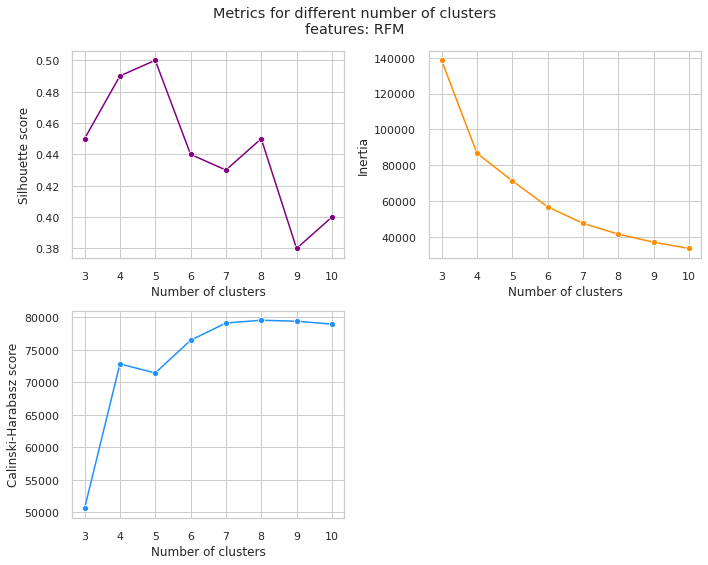

In [16]:
# Displaying metrics for grid search
compare_scores_KMeans(param_results, 'RFM', include_ch_score = True )

We can see that the elbow in the inertia curve appears for n_clusters=4. For this value we also have a high silhouette score: 0.48, relatively to the others, and a local maximum for the Calinski-Harabasz score.

Let us then observe the clustering for n_clusters=4.

#### Cluster visualization

We project the points into a 2d space for visualizing the resulting clusters.

In [17]:
# Clusterings chosen to visualize
cls = param_results.loc[4,'clustering']

We reduce the dimension of our dataset with t-SNE for visualization.

> ⚠️ For this visualization we use the **small** normalized sample `X_norm_sample` consisting of 20 000 individuals, since t-SNE takes too much time to execute.

The used clustering (labels) are those with the model trained with the **whole dataset**.

In [ ]:
# Embedding X_norm_sample for plotting
# Warning: this cell took 8 minutes to execute
X_embedded_2d = {}

for perp in [5,10,20,30,50]:
    X_embedded_2d[str(perp)] = TSNE(
        n_components=2,
        perplexity=perp
        ).fit_transform(X_norm_sample)

# Save embedding
# with open('X_embedded_2d_RFM.pickle', 'wb') as handle:
#    pickle.dump(X_embedded_2d, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [18]:
# # Load embedding
with open('X_embedded_2d_RFM.pickle', 'rb') as handle:
   X_embedded_2d = pickle.load(handle)

In [12]:
def plot_tsne(X_embedded_2d,cls,title,**kwargs):
  """
  Plots a grid with t-SNE 2d projections of a dataset
  following the clustering cls with several values for 
  perplexity.
  """

  # Creating figure:
  fig = plt.figure(figsize=(9, 6))
  sns.set_style("whitegrid")

  if 'idxs' in kwargs: #  When considering a sub-sample, for a clustering
    labelss = pd.Series(cls.labels_[kwargs['idxs']])
  else:
    labelss = pd.Series(cls.labels_)

  colors = { label : sns.color_palette('Set2')[label] for label in labelss.unique()}

  for idx,key in enumerate(X_embedded_2d.keys()):
    ax = fig.add_subplot(2,3,idx+1)
    ax.scatter(
      X_embedded_2d[key][:,0],
      X_embedded_2d[key][:,1],
      s = 15,
      c = labelss.map(colors),
      alpha = 0.4,
    )
    ax.grid(False)
    ax.axis('off')
    ax.set_title(f'Perplexity = {key}')

  # Creating legend
    handles = []
    for lab in np.unique(labelss):
      if lab == -1:
        lab_patch = mpatches.Patch(
          color = sns.color_palette('Set2')[lab],
          label = f'Noise\n{labelss.value_counts()[lab]} '
          )
        handles.append(lab_patch)
      else:
        lab_patch = mpatches.Patch(
          color=sns.color_palette('Set2')[lab],
          label=f"cluster {lab}\n{labelss.value_counts()[lab]}",
          )
        handles.append(lab_patch)
    
    
    fig.legend(
        title = '# of clients per cluster (in sample)',
        handles=handles,
        loc='upper center', 
        ncol=len(handles),
        bbox_to_anchor=(0.5,0.98,0,0),
        facecolor='whitesmoke',
        edgecolor='white',
        handlelength=1,
        frameon = True)

  # Setting a title
  plt.suptitle(title,y=1.09)
      
  # Display figure
  plt.tight_layout()
  plt.show()

In [13]:
def plot_tsne_one(X_embedded_2d,cls,title,perp,**kwargs):
  """
  Plots a t-SNE 2d projection of a dataset
  following the clustering cls with perplexity perp
  """

  # Creating figure:
  fig = plt.figure(figsize=(6, 6))
  sns.set_style("whitegrid")

  if 'idxs' in kwargs: #  If considering a sub-sample, for a clustering
    labelss = pd.Series(cls.labels_[kwargs['idxs']])
  else:
    labelss = pd.Series(cls.labels_)

  colors = { label : sns.color_palette('Set2')[label] for label in labelss.unique()}

  
  ax = fig.add_subplot(1,1,1)
  ax.scatter(
    X_embedded_2d[:,0],
    X_embedded_2d[:,1],
    s = 15,
    c = labelss.map(colors),
    alpha = 0.4,
    )
  ax.grid(False)
  ax.axis('off')
  ax.set_title(f'Perplexity = {perp}')

  # Creating legend
  handles = []
  for lab in np.unique(labelss):
    if lab == -1:
      lab_patch = mpatches.Patch(
        color = sns.color_palette('Set2')[lab],
        label = f'Noise\n{labelss.value_counts()[lab]} '
        )
      handles.append(lab_patch)
    else:
      lab_patch = mpatches.Patch(
        color=sns.color_palette('Set2')[lab],
        label=f"cluster {lab}\n{labelss.value_counts()[lab]}",
        )
      handles.append(lab_patch)
    
  
  fig.legend(
      title = '# of clients per cluster',
      handles=handles,
      loc='upper center', 
      ncol=len(handles),
      bbox_to_anchor=(0.5,0.98,0,0),
      facecolor='whitesmoke',
      edgecolor='white',
      handlelength=1,
      frameon= True
      )

  # Setting a title
  plt.suptitle(title,y=1.09)
      
  # Display figure
  plt.tight_layout()
  plt.show()

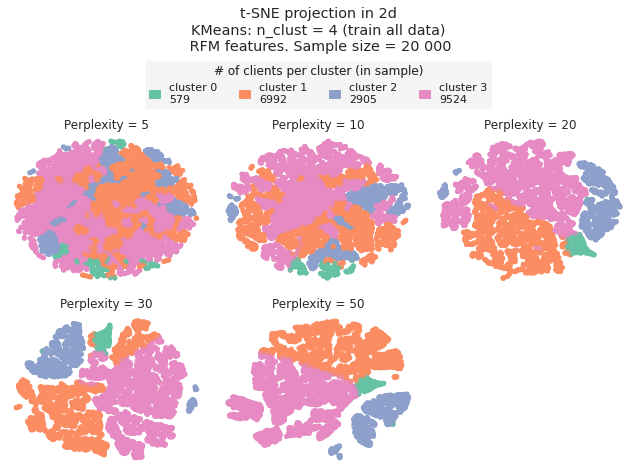

In [21]:
# Plot t-SNE 2d projection
title = 't-SNE projection in 2d\nKMeans: n_clust = 4 (train all data)\n RFM features. Sample size = 20 000'
plot_tsne(X_embedded_2d,cls,title,idxs = idx_sample)


Sizes of clusters:

In [22]:
print('Sizes of clusters with n_cluster=4:')
pd.Series(cls.labels_).value_counts()

Sizes of clusters with n_cluster=4:


3    51410
1    37983
0     2947
2     2905
dtype: int64

In **3D**:

The data has 3 dimensions (RFM), so we just plot it with the points labeled by colors corresponding to the two KMeans clusterings.

In this plot we can observe that people with high frequency of buying are clearly in a cluster which is displayed separately from the others. 

We can also conclude that the other clusters, from what we see in this visualization, differentiate the clients in three levels by amount of payment.

In [14]:
def RFM_3Dplot_data(X,X_norm,cls, **kwargs):
    """
    returns dataframe ready to do a 3d plot of X_norm
    X_norm has to be of size (int,3).
    It follows the clustering cls
    """
    if 'idx' in kwargs:
        labelss = cls.labels_[kwargs['idx']]
    else:
        labelss = cls.labels_
    
    if X.shape[1]>3:
        columns = range(X_norm.shape[1])
    else:
        columns = X.columns

    # Turning X_norm into a dataframe
    X_nor_df = pd.DataFrame(data = X_norm,
                            columns = columns)
    # Concatenate column with labels from clustering
    X_nor_df = pd.concat([X_nor_df, pd.DataFrame({'label' : labelss})], axis = 1)
    # Turning labels into strings so that plotly understand labels are discrete
    X_nor_df['label'] = X_nor_df['label'].astype(str)

    return X_nor_df

In [24]:
# Displaying sample of data obtained with this function
RFM_3Dplot_data(X, X_norm, cls = cls).head(5)

,recency_days,frequency,payment_value_avg,label
0,-0.835467,-0.164815,-0.088134,3
1,-0.815869,-0.164815,-0.625460,3
2,1.947459,-0.164815,-0.348951,1
3,0.536398,-0.164815,-0.548498,1
4,0.320819,-0.164815,0.169451,1


In [15]:
def plot3D_clusters(X,X_norm,cls,title, **kwargs):

    if 'idx' in kwargs: # if we are sampling data for plotting
        data = RFM_3Dplot_data(X,X_norm,cls, idx = kwargs['idx'])
    else:
        data = RFM_3Dplot_data(X,X_norm,cls)

    if 'high_dim' in kwargs: # If data has more than 3 features
        if kwargs['high_dim'] == True:
            # Data for 3d-plot
            X_embedded_3d = kwargs['embedding']
            data = RFM_3Dplot_data(X, X_embedded_3d, cls, idx = idx_sample)

            # plotting 3d projection of sample of data
            fig = px.scatter_3d(
                        data, 
                        x=0, 
                        y=1, 
                        z=2,
                        color = 'label',
                        hover_name = 'label',
                        opacity=0.6,
                        color_discrete_sequence = px.colors.qualitative.Set2,
                        title = title,
                        log_z=True,
                        log_x=True
                        )
            fig.update_traces(marker_size = 4)
            fig.show()

    else: # If plotting data with RFM features

        fig = px.scatter_3d(
            data, 
            x='recency_days', 
            y='frequency', 
            z='payment_value_avg',
            color = 'label',
            hover_name = 'label',
            hover_data = {'payment_value_avg' : False,
                        'recency_days' : False,
                        'frequency' : False,
                        'label' : False
                        },
            opacity=0.6,
            color_discrete_sequence = px.colors.qualitative.Set2,
            title = title,
            log_z=True,
            log_x=True
        )

        fig.update_traces(marker_size = 4)
        fig.show()

In [26]:
# Display 3d plot of clustering
plot3D_clusters(
    X,
    X_norm,
    cls,
    title ='KMeans: n_clust = 4 (train all data)<br>features: RFM'
)

#### Intra-cluster

For understanding the clustering obtained by the models we study each cluster separately by comparing their behaviour with respect to the chosen features. Which are, for now, **R**ecency, **F**requency, and **M**onetary.

For this we plot boxplots, one for cluster, if the values taken by the feature are several different, or scatterplot otherwise (with the mean per cluster).

In [17]:
def concat_labels(df, cls, col_name='label'):
    """
    Concatenates the label provided by the clustering cls, as
    the last column of df.
    """
    
    cluster_series = pd.DataFrame({col_name : cls.labels_})
    df_cl = pd.concat([df,cluster_series], axis=1)

    return df_cl


def cluster_dataframe(df,cls,label):
    """
    Returns sub-dataframe of individuals in the cluster
    labelled as label by the clustering cls. 

    Parameters:
        df: pandas.Dataframe
        cls: clustering
        label: int. any of the labels of the clustering cls
    """

    # Concatenating clusters as a new column of our df
    cluster_series = pd.DataFrame({'label':cls.labels_})
    df_cl = pd.concat([df,cluster_series], axis=1)

    # Filter individuals of the cluster
    result_df = df_cl.loc[df_cl['label'] == label]

    return result_df

In [18]:
def plot_mean_std(X, cls, feats, units, model_name, **kwargs):

    """
    For each feat in feats, plots cluster vs. boxplot of feat.
    where the cluster is represented by the label provided by the
    clustering cls.

    It also shows the number of individuals in each cluster, in a legend.

    Parameters:
        - df: pandas.Dataframe (the base dataframe)
        - cls: sklearn.cluster.KMeans (sklearn clustering)
        - feats: list of str (each str is a feature from df)
        - units: list of str (each str is the measurement unit of feat)
    """

    nb_feats = len(feats)
    labelss = np.unique(cls.labels_)

    data = pd.DataFrame(
        data = X,
        columns=feats
    )

    cluster_series = pd.DataFrame({'label':cls.labels_})
    data = pd.concat([data,cluster_series], axis=1)
    nb_rows_plot = (len(feats) // 2)+(len(feats) % 2)

    # Creating figure:
    fig = plt.figure(figsize=(8, 4*nb_rows_plot))

    idx = 0
    for feat in feats:
        idx += 1

        # If numerical variable has very few possible
        # different options, we do a scatterplot with
        # the mean for each cluster
        if data[feat].nunique() < 10:
            ax = fig.add_subplot(nb_rows_plot, 2, idx)

            # list of means for feat in each cluster
            y = []
            for lab in labelss:
                mean = data.loc[data['label'] == lab,feat].mean()
                y.append(mean)

            sns.scatterplot(
                x = labelss,
                y = y,
                s = 80,
                c = sns.color_palette('husl', len(labelss), desat=0.85)
            )
            ax.set_xticks(labelss)
            ax.xaxis.grid(False)
            ax.yaxis.grid(False)
            ax.set_title('Mean of ' + feat + ' by cluster')
            ax.set_xlabel(None)
            ax.set_ylabel(feat + ' (in ' + units[idx-1] +')')

        else:
            # Plot mean in the first column
            ax = fig.add_subplot(nb_rows_plot, 2, idx)
            sns.boxplot(
                data = data,
                x = 'label',
                y = feat,
                palette=sns.color_palette('husl', len(labelss), desat=0.85),
                sym='', 
                showmeans= True,
                meanline=True,
                meanprops={'color':'beige', 'linewidth':1.2},
                linewidth=0.8)

            # # Adding transparency to boxes
            # for patch in ax.patches:
            #     r, g, b, a = patch.get_facecolor()
            #     patch.set_facecolor((r, g, b, .75))

            ax.xaxis.grid(False)
            ax.yaxis.grid(False)
            ax.set_ylabel(feat + ' (in ' + units[idx-1] +')')
            ax.set_title('Distribution of ' + feat + ' by cluster')
            ax.set_xlabel(None)

    # Creating legend
    handles = []
    if 'adjust' in kwargs: #  See bbox_to_anchor
        h,t = 0.985,1.04
    else:
        h,t = 0.97,1.05
    for idx,lab in enumerate(labelss):
        lab_patch = mpatches.Patch(
            color=sns.color_palette('husl', len(labelss), desat=0.85)[idx],
            label=f"cluster {lab}\n{data.loc[data['label'] == lab].shape[0]}",
            )
        handles.append(lab_patch)
    fig.legend(
        title = '# of clients per cluster',
        handles=handles,
        loc='upper center', 
        ncol=len(handles),
        bbox_to_anchor=(0.52,h,0,0),
        facecolor='whitesmoke',
        edgecolor='white',
        handlelength=1,
        frameon=True)

    # Setting a title
    plt.suptitle(f'Measures by feature for each cluster\n{model_name}',
    y=t)

    
    # Display figure
    plt.tight_layout()
    plt.show()
   

Let us use the preceding function for plotting the info for the best clustering obtained for KMeans, that is, for n_clusters = 5.

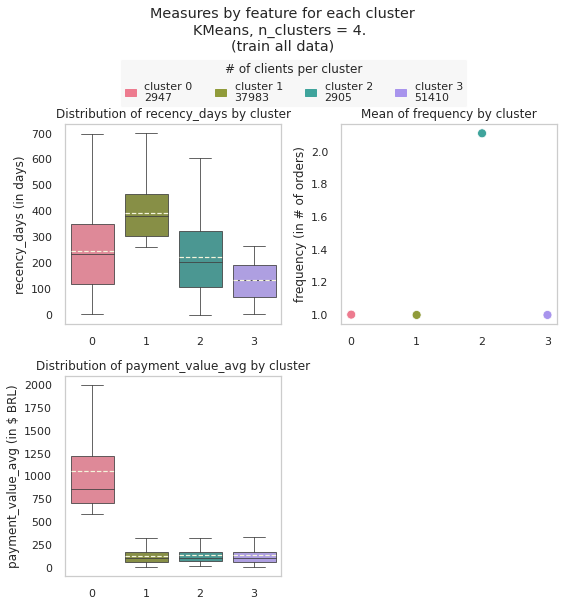

In [29]:
# Plot
plot_mean_std(
    X, 
    cls, 
    feats, 
    units, 
    'KMeans, n_clusters = 4. \n(train all data)'
    )

## A first segmentation: client profiles

**Interpretation for clusters:** 

| Cluster label | Observations |
|---------------|--------------|
|3 | Clients who bought very recently, with average frequency ang payment value. (**Average client cluster**, since it is the biggest)  | 
|1 | Non-regular clients, bought **longtime ago**, with average frequency and payment value. (It is the second biggest cluster) | 
|0 | Clients with variable recency, average frequency, but **high monetary expenses** . | 
|2 |  **Frequent** buyers, with an average recency and average payment value. | 

We will now add more features to have clusters with more rich information.

# Adding new features

With this conclusion, we now add more features to the model, and we check that there is still an interpretation of the clusters.

## RFM + score

In [30]:
# Defining new features
feats = [
    'frequency', 
    'review_score_avg',
    'recency_days',
    'payment_value_avg'
]
units = [
    '# of purchase',
    'score(1-5)', 
    'days', 
    '$ BRL' ]

# Defining feature matrix
X = df[feats]

# Scaling
sc = StandardScaler()
X_norm = sc.fit_transform(X)

# Sampling (for plots)
X_norm_sample = X_norm[idx_sample]

# Shape
print(f'Shape of X_norm : {X_norm.shape}')
print('Preview of X_norm:')
print(X_norm[:5])

Shape of X_norm : (95245, 4)
Preview of X_norm:
[[-0.16481482  0.67319623 -0.83546669 -0.08813362]
 [-0.16481482 -0.08217777 -0.81586863 -0.62545954]
 [-0.16481482 -0.83755177  1.9474586  -0.34895052]
 [-0.16481482 -0.08217777  0.53639789 -0.54849794]
 [-0.16481482  0.67319623  0.32081917  0.16945117]]


In [31]:
# Grid search for best parameters
param_results = param_search_KMeans(X_norm)

# Iterations: 8
0
1
2
3
4
5
6
7


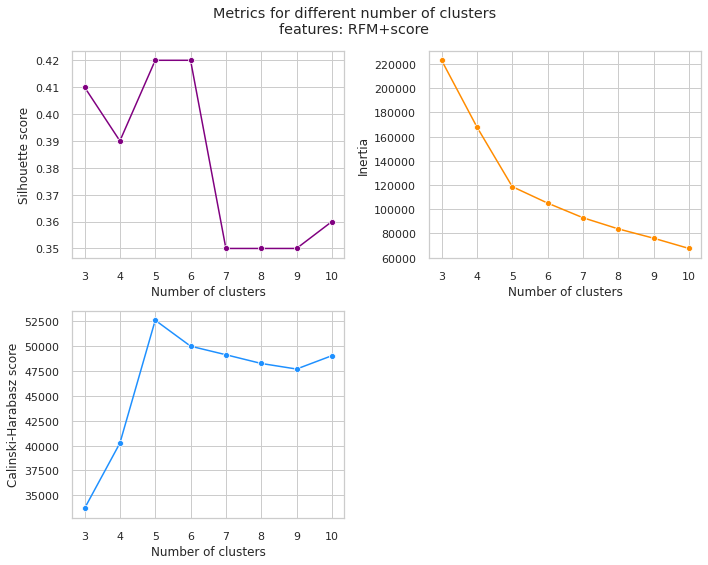

In [32]:
# Displaying grid search results
compare_scores_KMeans(
    param_results,
    include_ch_score=True,
    title='RFM+score'
    )


We can see that for the set of features RFM+score, the best number of clusters is greater: 5. The elbow for inertia curve is clearly at n_clusters=5. At this number there is also a maximum for the silhouette and Calinski-Harabasz score.

Let us study the obtained clusters in more detail.

In [33]:
# Train with feats: RFM+score
cls = KMeans(
    n_clusters=5
)
cls.fit(X_norm)

KMeans(n_clusters=5)

In [34]:
# Review sizes of clusters
print('Sizes of clusters:')
pd.Series(cls.labels_).value_counts()

Sizes of clusters:


2    41871
1    31776
0    16378
3     2905
4     2315
dtype: int64

### Inter-cluster

Let us visualize this clustering.

* 2d with t-SNE

In [ ]:
# Embedding X_norm for plotting
# Warning: this cell took 8 minutes to execute
X_embedded_2d = TSNE(
        n_components=2,
        perplexity=50
        ).fit_transform(X_norm_sample)

# Save embedding
# with open('X_embedded_2d_RFM+s.pickle', 'wb') as handle:
#    pickle.dump(X_embedded_2d, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [35]:
# Load embedding
with open('X_embedded_2d_RFM+s.pickle', 'rb') as handle:
    X_embedded_2d = pickle.load(handle)

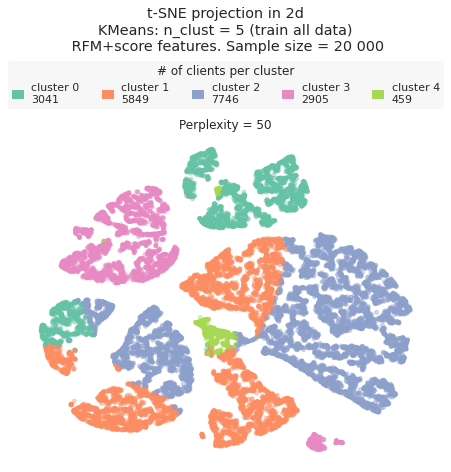

In [36]:
# Plot t-SNE 2d projection
title = 't-SNE projection in 2d\nKMeans: n_clust = 5 (train all data)\n RFM+score features. Sample size = 20 000'
plot_tsne_one(X_embedded_2d,cls,title,perp=50,idxs = idx_sample)


* **3d:** Since we have 4 dimensions now, we reduce the dimensions to 3 to visualize with t-SNE.

In [ ]:
# Projection of data in a 3d space
X_embedded_3d = TSNE(
        n_components=3,
        perplexity=50
).fit_transform(X_norm_sample)

# Save embedding
# with open('X_embedded_3d_RFM+s.pickle', 'wb') as handle:
#    pickle.dump(X_embedded_3d, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [37]:
# Load embedding
with open('X_embedded_3d_RFM+s.pickle', 'rb') as handle:
    X_embedded_3d = pickle.load(handle)

In [38]:
plot3D_clusters(
    X,X_norm,cls,
    title='t-SNE projection 3D<br>KMeans n_clust = 5 (train all data)<br>features: RFM+score',
    high_dim=True,
    embedding=X_embedded_3d
)

This visualization does not show very clear results ; we do not see points coming from cluster 3 or 4.

### Intra-cluster

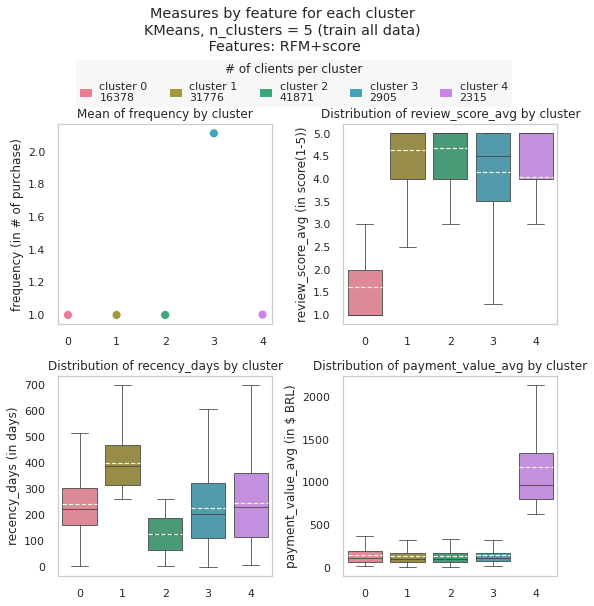

In [39]:
# Plot
plot_mean_std(
    X, 
    cls, 
    feats, 
    units, 
    'KMeans, n_clusters = 5 (train all data)\n Features: RFM+score')

### A second segmentation

With this set of features (RFM+score) for the clustering we obtain the following profiles:

| Cluster label | Profile keyword | Observations |
|---------------|------|--------|
|1 | **Non-regular, happy**| Non-regular clients, bought longtime ago, with average frequency and payment value. (It is the second biggest cluster). Higher than avg. rating score. | 
|3 | **Frequent buyer** | Frequent buyers, with an average recency and average payment value, but higher than average frequency: these clients made more order than the average client, with a mean of 2. |
|4 |  **High-price buyer** |  Client with an average frequency and recency but with orders really higher than average in price (payment value). They have a higher than average rating score. |
|0 | **Generally unhappy** | This clients are not satisfied with their orders, as they have a really lower than average rating score avg: between 1 and 2 average and up to 3. |
|2 | **Average, recent** | The average clients: generally happy (satisfied) and have the most recent orders. This is the biggest cluster.|

## Definitive model

Having defined a base profile for each cluster, and from the fact that KMeans with n_cluster=5 produces a good clustering and differentiation of clients, we choose a definitive set of features that we consider important for the final clustering. 

Indeed this set of features are of nature: monetary and quantity. 

### Chosen set of features

The **definitive set of features** :

| Feature label    | feature |
|------------------|---------|
|frequency         | Total number of orders made by the customer
|review_score_avg  | Average score rating given by the customer, considering all of their orders.
|recency_days      | Number of days since last order.
|payment_value_avg | Average total price of order of the customer.
|item_quant_avg    | Average quantity of items in the customer's orders.
|price_item_avg    | Average price of items in a customer's order.

Let us train this model with these features and let's see that they define well profiled clusters.

### Training and grid search

In [19]:
# Defining features
feats = [
    'frequency', 
    'review_score_avg',
    'recency_days',
    'payment_value_avg',
    'item_quant_avg',
    'price_item_avg'
    ]
units = [
    '# of purchase',
    'score(1-5)', 
    'days', 
    '$ BRL',
    '# items',
    '$ BRL'
     ]

# Defining feature matrix
X = df[feats]

# Scaling
sc = StandardScaler()
X_norm = sc.fit_transform(X)

# Sample (for visualizations)
X_norm_sample = X_norm[idx_sample]

# Shape
print(f'Shape of X_norm : {X_norm.shape}')
print('Preview of X_norm:')
print(X_norm[:5])

Shape of X_norm : (95245, 6)
Preview of X_norm:
[[-0.16481482  0.67319623 -0.83546669 -0.08813362 -0.26871853  0.01497963]
 [-0.16481482 -0.08217777 -0.81586863 -0.62545954 -0.26871853 -0.57237289]
 [-0.16481482 -0.83755177  1.9474586  -0.34895052 -0.26871853 -0.30727054]
 [-0.16481482 -0.08217777  0.53639789 -0.54849794 -0.26871853 -0.53485641]
 [-0.16481482  0.67319623  0.32081917  0.16945117 -0.26871853  0.28008198]]


In [41]:
# Grid search hyperparameters
param_results = param_search_KMeans(X_norm)

# Iterations: 8
0
1
2
3
4
5
6
7


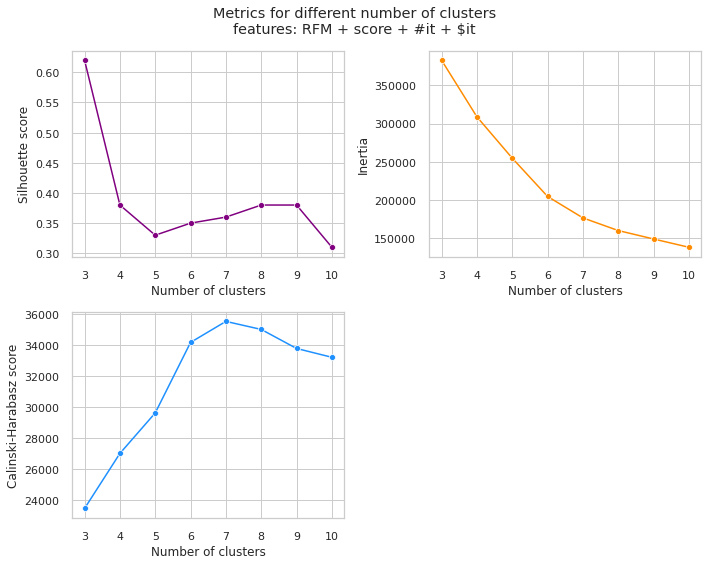

In [42]:
# Displaying grid search results
compare_scores_KMeans(
    param_results, 
    'RFM + score + #it + $it',
    include_ch_score = True)

In this case, the silhouette score is quite deceiving. The elbow in the inertia curve can be considered at number of clusters = 6, and high values for the Calinski-Harabasz score are starting from number of cluster = 6.

Based on that, **we choose n_clusters = 6** for training KMeans.

In [21]:
# Train with feats
cls = KMeans(
    n_clusters=6
)
cls.fit(X_norm)

KMeans(n_clusters=6)

In [22]:
# Review sizes of clusters
print('Sizes of clusters:')
pd.Series(cls.labels_).value_counts()

Sizes of clusters:


1    41159
0    30947
4    15650
3     2876
2     2594
5     2019
dtype: int64

The sizes of clusters are well balanced. The smallest cluster has 2019 clients which is a good amount of customers: more than 2%.

### Inter-cluster

Let us visualize this clustering.

* 2d with t-SNE

In [ ]:
# Embedding X_norm for plotting
# Sample
X_norm_sample = X_norm[idx_sample]

# Warning: this cell took 8 minutes to execute
X_embedded_2d = TSNE(
        n_components=2,
        perplexity=50
        ).fit_transform(X_norm_sample)

# Save embedding
# with open('X_embedded_2d_allfeats.pickle', 'wb') as handle:
#    pickle.dump(X_embedded_2d, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [45]:
# Load embedding
with open('X_embedded_2d_allfeats.pickle', 'rb') as handle:
   X_embedded_2d = pickle.load(handle)

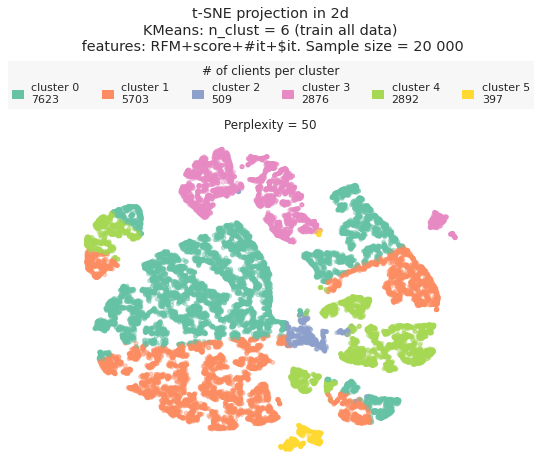

In [46]:
# Plot t-SNE 2d projection
title = 't-SNE projection in 2d\nKMeans: n_clust = 6 (train all data)\n features: RFM+score+#it+$it. Sample size = 20 000'
plot_tsne_one(
    X_embedded_2d,
    cls,
    title,
    perp=50,
    idxs=idx_sample)


* **3d:** Since we have 4 dimensions now, we reduce the dimensions to 3 to visualize with t-SNE.

In [ ]:
# Projection of data in a 3d space
X_embedded_3d = TSNE(
        n_components=3,
        perplexity=50
        ).fit_transform(X_norm_sample)

# Save embedding
# with open('X_embedded_3d_allfeats.pickle', 'wb') as handle:
#    pickle.dump(X_embedded_3d, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [47]:
# Load embedding
with open('X_embedded_3d_allfeats.pickle', 'rb') as handle:
   X_embedded_3d = pickle.load(handle)

In [48]:
plot3D_clusters(
    X,X_norm,cls,
    title='t-SNE projection 3D<br>KMeans n_clust = 6 (train all data)<br>features: RFM+score+#it+$it.',
    high_dim=True,
    embedding=X_embedded_3d
)

### Intra-cluster

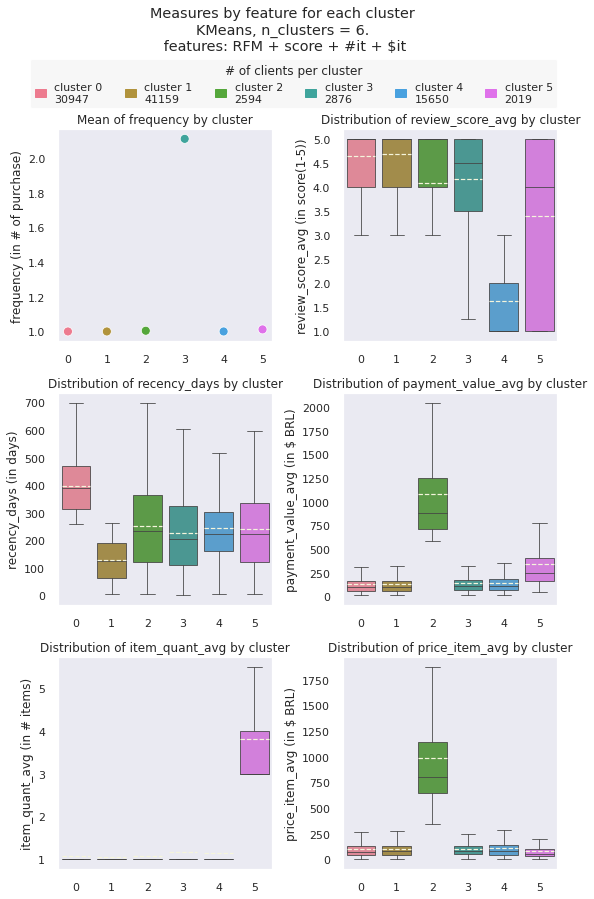

In [26]:
# Plot
plot_mean_std(
    X, 
    cls, 
    feats, 
    units, 
    'KMeans, n_clusters = 6.\n features: RFM + score + #it + $it',
    adjust=True)

### Definitive segmentation

With this definitive set of features (RFM + score + # items + $ item) for the clustering we obtain the following profiles:

| Cluster label | Profile keyword | Observations |
|---------------|------|--------|
|1 | **Non-regular, happy**| Non-regular clients, bought longtime ago, with average frequency and payment value. (It is the second biggest cluster). Higher than avg. rating score. | 
|2 | **High-price buyer** |  Client with an average frequency and recency but with orders really higher than average in price (payment value). Their rating scores are between 3 and 5, so relatively happy. But the mean rating score is lower than clients from cluster 0. |
|5 | **Bulk buyer** | Client with a large number of items per order, in average: more than 3 items per order. They also tend to have a higher than average total price per order, naturally. Scores vary from 1 to 5.
|4 | **Generally unhappy** | This clients are not satisfied with their orders, as they have a really lower than average rating score avg: between 1 and 2 average and up to 3. |
|3 | **Frequent buyer** | Frequent buyers, with an average recency and average payment value. Rating score varies, with a mean of 4. |
|0 | **Average, recent** | The average clients: generally happy (satisfied) and have the most recent orders. This is the biggest cluster in size.|

## More detailed customer profiles

The described customer profiles concern the variables used for modeling. So this profiles are in terms of monetary and quantity nature, as the features used.

We study some statistics of the obtained clusters for getting more detailed **useful** customer profiles.

In [23]:
cluster_column = pd.DataFrame({'cluster':cls.labels_})
df = pd.concat([df, cluster_column], axis=1)
df.head(6)

,frequency,review_score_avg,price_item_avg,item_quant_avg,payment_install_avg,payment_value_avg,recency_days,order_status,order_purchase_timestamp,order_approved_at,...,product_category_name_english,product_vol_cm3,seller_city,seller_state,latit_seller,long_seller,latit_customer,long_customer,days_bet_purch_deliver,cluster
0,1,5.0,129.90,1.0,8.0,141.90,115,delivered,2018-05-10 10:56:27,2018-05-10 11:11:18,...,bed_bath_table,7616.0,piracicaba,SP,-22.708702,-47.664701,-23.340235,-46.830140,1.0,1
1,1,4.0,18.90,1.0,1.0,27.19,118,delivered,2018-05-07 11:11:27,2018-05-07 18:25:44,...,health_beauty,5148.0,sao paulo,SP,-23.490759,-46.583369,-23.559115,-46.787626,2.0,1
2,1,3.0,69.00,1.0,8.0,86.22,541,delivered,2017-03-10 21:05:03,2017-03-10 21:05:03,...,stationery,43750.0,campo limpo paulista,SP,-23.211746,-46.762875,-27.542880,-48.633426,2.0,0
3,1,4.0,25.99,1.0,4.0,43.62,325,delivered,2017-10-12 20:29:41,2017-10-12 20:49:17,...,telephony,1045.0,sao paulo,SP,-23.543150,-46.490101,-1.312214,-48.483159,0.0,0
4,1,5.0,180.00,1.0,6.0,196.89,292,delivered,2017-11-14 19:45:42,2017-11-14 20:06:52,...,telephony,528.0,jacarei,SP,-23.302318,-45.971888,-23.505548,-47.469705,2.0,0
5,1,4.0,154.00,1.0,8.0,166.98,150,delivered,2018-04-05 19:33:16,2018-04-05 19:48:59,...,garden_tools,8241.0,santo andre,SP,-23.700198,-46.513128,-23.515676,-46.688233,1.0,1


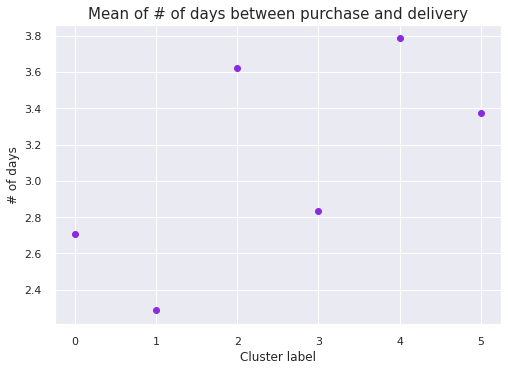

In [34]:
plt.scatter(
    x = range(7),
    y = [df.loc[df['cluster'] == i, 'days_bet_purch_deliver'].mean() for i in range(7)],
    color='blueviolet'
)
plt.title('Mean of # of days between purchase and delivery', fontsize=15)
plt.xlabel('Cluster label')
plt.ylabel('# of days')
plt.show()

In [28]:
df.loc[df['cluster'] == 4, 'days_bet_purch_deliver'].mean()

3.78451053833898

In [29]:
df.loc[df['cluster'] != 4, 'days_bet_purch_deliver'].mean()

2.5419262314908084

<AxesSubplot:xlabel='Percent', ylabel='days_bet_purch_deliver'>

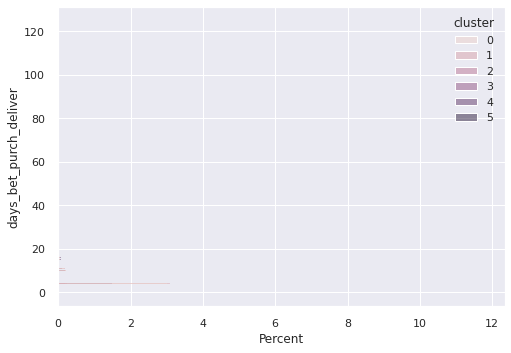

In [25]:
sns.histplot(
    data = df,
    stat = 'percent',
    y = 'days_bet_purch_deliver',
    hue='cluster')

Let us define a function that will allow us to plot the top 3 on some categorical variables.

In [52]:
def top3_per_cluster(df, feat, labels):
    """
    Returns a dictionary with unique labels of clustering
    as keys and a table (dataframe) as values.
    In this table there are the top 3 categories for the feature 3.

    Parameters:
        - df: pd.DataFrame 
            with feat as column
        - feat: str
            label of one of the columns of df. A categorical feature.
        - labels: array of shape (df.shape[0],).  
            Usually: cls.labels_ coming from clustering
    """
    # The different cluster labels
    sizes = pd.Series(labels).value_counts()
    labelss = sizes.index.tolist()

    tables = {}
    categories = set()

    for labl in labelss:
        # Filter df corresp. to cluster labl
        labl_data = df.loc[df['cluster'] == labl]

        # Group by values taken by categorial feature, take top3
        count = labl_data.groupby(feat).size().reset_index(name='counts')
        count = count.sort_values('counts', ascending=False).head(3).reset_index(drop=True)

        # Add column of normalized values
        count['Percent'] = (count['counts']/sizes[labl]).round(2)*100

        # Add table to result
        tables[str(labl)] = count

        # Add new categories to set of categories
        categories = categories.union(set(count[feat]))

    return {'tables':tables, 'categories':list(categories)}


def plot_top3(df, feat , labels, name, y_title):
    """
    Plots circles for each top 3 categories for
    the categorical feature feat. Size of the circle is proportional
    to number of clients in cluster to belong to the category.
    """
    
    data = top3_per_cluster(df, feat , cls.labels_)

    # Encoding categories with numbers
    cat_codes = { cat:idx for idx, cat in enumerate(data['categories'])}

    fig, ax = plt.subplots()
    ax.set_yticks(range(len(data['categories'])))
    ax.set_yticklabels(data['categories'])
    ax.set_xticks(np.unique(cls.labels_))
    ax.set_xticklabels(np.unique(cls.labels_))
    ax.set_ylim(-0.5,7.5)
    ax.set_xlim(-0.5,5.5)
    ax.grid(False)
    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)

    for labl in data['tables'].keys():
        table = data['tables'][labl]
        table['cat_code'] = table[feat].map(cat_codes)

        sns.scatterplot(
            data = table,
            x = [labl]*3,
            y = table['cat_code'],
            size = 'Percent',
            sizes = (200,700),
            ax = ax,
            legend= False,
            color=sns.color_palette('Set2')[int(labl)]
        )
    ax.set_xlabel('Cluster label')
    ax.set_ylabel(None)
    ax.set_title(f'Top 3 {name} by cluster', size=15, y = y_title)
    plt.show()



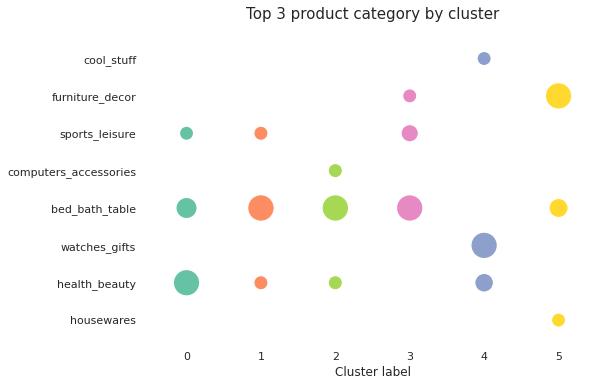

In [62]:
plot_top3(
    df, 
    'product_category_name_english', 
    cls.labels_, 
    name='product category',
    y_title=1.05)

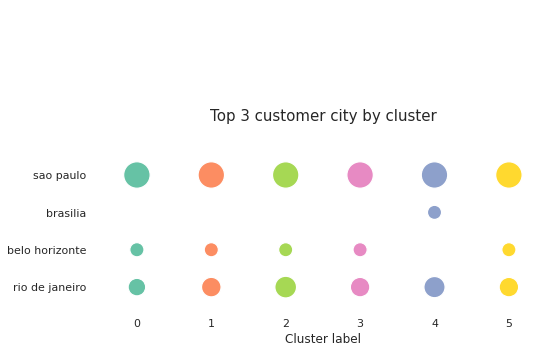

In [63]:
plot_top3(
    df, 
    'customer_city', 
    cls.labels_, 
    name='customer city',
    y_title=0.6)

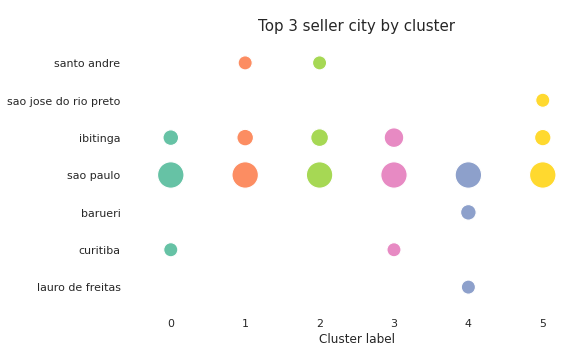

In [64]:
plot_top3(
    df, 
    'seller_city', 
    cls.labels_, 
    name='seller city',
    y_title=0.9)

The last three plots give useful information about customers in each cluster.

* The top 3 product categories shows us which type of products are preferred.
* The top 3 cities shows us where the customers are. We can see that most users of this site come from Sao Paulo (first city for each cluster) and Rio de Janeiro (second city for each cluster).

In [67]:
import plotly.express as px
fig = px.scatter_geo(data_frame= df.sample(10000), 
                     lat = 'latit_customer',
                     lon = 'long_customer',
                     scope = 'world',
                     color='cluster'
                     )
fig.show()

However, this plot shows that customers on each cluster are more or less uniformly distributed along the territory. So this segmentation does not takes geography into account.

# Testing other models: DBSCAN and Hierarchical

## DBSCAN

We encountered difficulties to test DBSCAN:

* Even with only the 3 features RFM (recency, frequency, monetary) we had execution problems, both locally and in google colab. It always exceeded the RAM and made the kernel crash.

* Even with a smaller sample or with limiting time of execution, the computer crashed. We explain our approach here:

We tried two approaches:

1. In the following cell there's the algorithm used to search a parameter grid for appropriate parameters for DBSCAN: We used `X_sample` which consists of a **sample of 20 000 rows** (out of a total of 95 000). 

    This worked well, and a list of (nice) silhouette scores is produced. But a sample of 20 000 does not seem to contain a good amount of information.

    Even when supposing that is is sufficient, when we try to train the chosen DBSCAN model with the whole dataset (95 000 rows), the computer (or google colab) crashes again.

2. Following that situation, we decided to execute the cell again, with the **whole dataset**, but introducing a function that makes the training (`DBSCAN.fit()`) stop, if the execution takes more than a fixed number of seconds (we tried 120, and 10). 

    In both cases, the computer (and google colab) chrashed.

These reasons, and the lack of finding a solution, made **DBSCAN not a useful model in our case**. The following cells, however contain all the code used to attain those conclusions.

### DBSCAN, approach with a smaller sample

We make a grid search for hyperparameters.

In [68]:
# Defining features
feats = [
    'frequency', 
    'review_score_avg',
    'recency_days',
    'payment_value_avg',
    'item_quant_avg',
    'price_item_avg'
    ]
units = [
    '# of purchase',
    'score(1-5)', 
    'days', 
    '$ BRL',
    '# items',
    '$ BRL'
     ]

# Defining feature matrix
X = df[feats]

# Scaling
sc = StandardScaler()
X_norm = sc.fit_transform(X)

# Sample (for visualizations)
X_norm_sample = X_norm[idx_sample]

# Shape
print(f'Shape of X_norm : {X_norm.shape}')
print('Preview of X_norm:')
print(X_norm[:5])

Shape of X_norm : (95245, 6)
Preview of X_norm:
[[-0.16481482  0.67319623 -0.83546669 -0.08813362 -0.26871853  0.01497963]
 [-0.16481482 -0.08217777 -0.81586863 -0.62545954 -0.26871853 -0.57237289]
 [-0.16481482 -0.83755177  1.9474586  -0.34895052 -0.26871853 -0.30727054]
 [-0.16481482 -0.08217777  0.53639789 -0.54849794 -0.26871853 -0.53485641]
 [-0.16481482  0.67319623  0.32081917  0.16945117 -0.26871853  0.28008198]]


In [69]:
# Specify parameters and distributions to sample from
param_grid = list(ParameterGrid(
    {
    'eps' : [0.1, 0.5, 1, 10],
    'min_samples' : [10, 50, 100, 200]
}))
print(f'# Iterations : {len(param_grid)}')

# Storing dictionary
result_grid = {
    'param_eps' : [],
    'param_min_samp' : [],
    'clustering' : [],
    'nb_clusters' : [],
    'Silhouette score' : [],
    'Calinski-Harabasz score' : []
}

i = 0

# Loop over parameters
for params in param_grid:
    print(i)
    i += 1
    cls = DBSCAN(
        eps = params['eps'],
        min_samples = params['min_samples']
    )
    cls.fit(X_norm_sample)

    result_grid['param_eps'].append(params['eps'])
    result_grid['param_min_samp'].append(params['min_samples'])
    result_grid['clustering'].append(cls)

    count_clusters = pd.Series(cls.labels_).value_counts()
    nb_clust = count_clusters.shape[0]
    if -1 in count_clusters.index:
        nb_clust = nb_clust - 1

    result_grid['nb_clusters'].append(nb_clust)

    if nb_clust >= 2:
        result_grid['Silhouette score'].append(
            silhouette_score(X_norm_sample,cls.labels_, sample_size=1000).round(2)
        )
        result_grid['Calinski-Harabasz score'].append(
            calinski_harabasz_score(X_norm_sample,cls.labels_)
        )
    else:
        result_grid['Silhouette score'].append(
            np.NaN
        )
        result_grid['Calinski-Harabasz score'].append(
            np.NaN
        )


# Display results
result_grid_df = pd.DataFrame(result_grid)
# result_grid_df.set_index('n_clusters', inplace=True)
result_grid_df

# Iterations : 16
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


,param_eps,param_min_samp,clustering,nb_clusters,Silhouette score,Calinski-Harabasz score
0,0.1,10,"DBSCAN(eps=0.1, min_samples=10)",50,-0.34,125.486450
1,0.1,50,"DBSCAN(eps=0.1, min_samples=50)",5,-0.35,294.211632
2,0.1,100,"DBSCAN(eps=0.1, min_samples=100)",3,-0.28,249.165169
3,0.1,200,"DBSCAN(eps=0.1, min_samples=200)",0,NaN,NaN
4,0.5,10,DBSCAN(min_samples=10),22,0.12,974.105974
5,0.5,50,DBSCAN(min_samples=50),8,0.10,1715.874223
6,0.5,100,DBSCAN(min_samples=100),6,0.09,1792.523752
7,0.5,200,DBSCAN(min_samples=200),4,0.06,1937.437609
8,1.0,10,"DBSCAN(eps=1, min_samples=10)",7,0.35,2860.961263
9,1.0,50,"DBSCAN(eps=1, min_samples=50)",5,0.31,3326.780613


We display here the **results of clustering with DBSCAN**. 

We drop rows with NaN values, which correspond to clusterings where there is only one cluster obtained, and such a clustering is therefore not interesting.

A graphic is plotted below to visually study these results.

In [70]:
# Data frame of results without NaN rows.
dbscan_data = result_grid_df.sort_values(by='Silhouette score').dropna(
    axis = 'index',
    how = 'any'
)
dbscan_data.reset_index(inplace=True,drop=True)

dbscan_data

,param_eps,param_min_samp,clustering,nb_clusters,Silhouette score,Calinski-Harabasz score
0,0.1,50,"DBSCAN(eps=0.1, min_samples=50)",5,-0.35,294.211632
1,0.1,10,"DBSCAN(eps=0.1, min_samples=10)",50,-0.34,125.486450
2,0.1,100,"DBSCAN(eps=0.1, min_samples=100)",3,-0.28,249.165169
3,0.5,200,DBSCAN(min_samples=200),4,0.06,1937.437609
4,0.5,100,DBSCAN(min_samples=100),6,0.09,1792.523752
5,0.5,50,DBSCAN(min_samples=50),8,0.10,1715.874223
6,0.5,10,DBSCAN(min_samples=10),22,0.12,974.105974
7,1.0,200,"DBSCAN(eps=1, min_samples=200)",3,0.28,4020.223108
8,1.0,50,"DBSCAN(eps=1, min_samples=50)",5,0.31,3326.780613
9,1.0,100,"DBSCAN(eps=1, min_samples=100)",3,0.31,4510.075141


In [71]:
# Plotting metrics of DBSCAN
fig = px.scatter(
    data_frame=dbscan_data,
    x = 'Silhouette score',
    y = 'nb_clusters',
    hover_data={
        'param_eps' : True,
        'param_min_samp' : True,
        'Silhouette score' : False,
        'nb_clusters' : False,
        'Calinski-Harabasz score' : True
    },
    title= 'DBSCAN: Silhouette score vs. # of clusters<br>sample size = 20 000, feats: RFM<br>hover for values of eps and min_samples'
)

fig.update_layout(
    yaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 2
    )
)


Choosing a *best* set of parameters from this plot, would be to chose first a reasonable number of clusters (y-axis), here for example between 3 and 6 (included) for our case, and then to choose a high value of Silhouette score.

We can see that most of the points with a high Silhouette score, have eps=1, for example. But min_samples varies.

#### Cluster visualization

We project the points into a 2d space for visualizing the resulting clusters. We chose the hyperparameters

In [72]:
# Clustering chosen to visualize
eps = dbscan_data.loc[8, 'param_eps']
min_samples = dbscan_data.loc[8, 'param_min_samp']

cls = DBSCAN(
    eps = eps,
    min_samples = min_samples
)
cls.fit(X_norm_sample)

DBSCAN(eps=1.0, min_samples=50)

We reduce the dimension of our dataset with t-SNE for visualization.

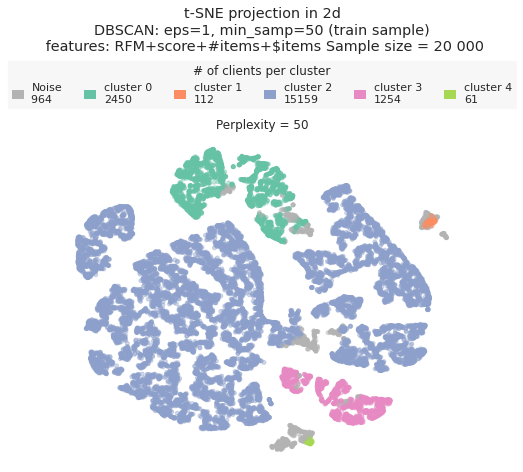

In [73]:
# Plot t-SNE 2d projection
title = 't-SNE projection in 2d\nDBSCAN: eps=1, min_samp=50 (train sample)\n features: RFM+score+#items+$items Sample size = 20 000'
plot_tsne_one(X_embedded_2d,cls,title, perp = 50, idx = idx_sample)


The clustering obtained with DBSCAN does seems to produce clearly separate clusters for perplexity value = 50, but one of the clusters contains nearly all observations. And this is the case for other tested clustering (different hyperparameters, for ex eps=1, min_samples=50).

* Intracluster

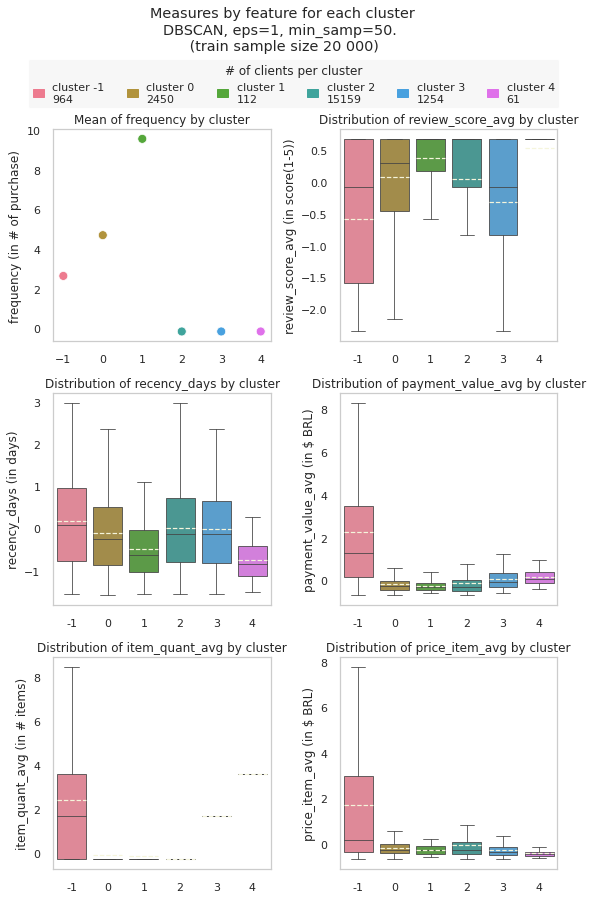

In [74]:
# Plot
plot_mean_std(
        X_norm_sample, 
        cls, 
        feats, 
        units, 
        'DBSCAN, eps=1, min_samp=50. \n (train sample size 20 000)',
        adjust=True)

### DBSCAN Test with whole dataset: impossible

We then tried to train the **whole dataset** by choosing a set of parameters for DBSCAN that look well following the previous results.

In [ ]:
# Training model with whole dataset
cls = DBSCAN(
    eps= 0.1,
    min_samples= 50
).fit(X_norm)

In [ ]:
# Studying number of observations per cluster
pd.Series(cls.labels_).value_counts()

 0     86955
-1      7125
 1       296
 4       186
 5       164
 10      133
 9       121
 7       113
 3        97
 6        91
 8        53
 11       45
 2        31
dtype: int64

In [ ]:
# Kernel crashed when continuing this observations
cls = DBSCAN(
    eps= 0.5,
    min_samples= 100
).fit(X_norm)

: 

: 

Then we were not able to do a similar table for comparing different hyper-parameters for DBSCAN with the while dataset.

### DBSCAN whole dataset, limiting time

We introduced a function to limit the executing time. But it was not sufficiend, the kernel kept crashing.
The limiting function time was written with the module **func_timeout**, and was learned thanks to [this article](https://blog.finxter.com/how-to-limit-the-execution-time-of-a-function-call/)

Maybe one solution is not to have a function that limits time but RAM. But I don't know how to do that yet.

In [ ]:
# Grid search for parameters for DBSCAN:

# Specify parameters and distributions to sample from
param_grid = list(ParameterGrid(
    {
    'eps' : [0.1, 0.5, 1, 10, 100],
    'min_samples' : [10, 50, 100, 200]
}))
print(f'# Iterations : {len(param_grid)}')

# Storing dictionary
result_grid = {
    'param_eps' : [],
    'param_min_samp' : [],
    'clustering' : [],
    'nb_clusters' : [],
    'Silhouette score' : []
}

i = 0

# Loop over parameters of grid
for params in param_grid:
    print(i)  # To see if the loop is working
    i += 1

    # This function is an argument of the function which will limit
    # the time of execution
    def model_and_fit():
        cls = DBSCAN(
            eps = params['eps'],
            min_samples = params['min_samples']
            ).fit(X_norm) 
    
        return cls

    def run_model_and_fit(model_and_fit, max_wait, default_val):
        try:
            return func_timeout.func_timeout(max_wait,
                                    model_and_fit)
        except func_timeout.FunctionTimedOut:
            pass
        return default_val

    cls = run_model_and_fit(
        model_and_fit,  # function to try to execute
        10,  # Max number of seconds to execute
        'timeout'  # If timedout, return this str
        )

    # Add info to the results
    result_grid['param_eps'].append(params['eps'])
    result_grid['param_min_samp'].append(params['min_samples'])

    if cls == 'timeout': #  If clustering was not possible (too long)
      result_grid['clustering'].append(cls)
      result_grid['nb_clusters'].append(np.nan)
      result_grid['Silhouette score'].append(np.nan)
    else:
      result_grid['clustering'].append(cls)

      count_clusters = pd.Series(cls.labels_).value_counts()
      nb_clust = count_clusters.shape[0]
      if -1 in count_clusters.index:
          nb_clust = nb_clust - 1

      result_grid['nb_clusters'].append(nb_clust)

      if nb_clust >= 2:
          result_grid['Silhouette score'].append(
              silhouette_score(X_norm,cls.labels_, sample_size=1000).round(2)
          )
      else:
          result_grid['Silhouette score'].append(
              np.NaN
          )

# Display results
result_grid_df = pd.DataFrame(result_grid)
# result_grid_df.set_index('n_clusters', inplace=True)
result_grid_df

# Iterations : 20
0
1
2
3
4
5
6


: 

: 

### DBSCAN conclusion

In conclusion. For our case, skills and machines, using DBSCAN clustering is not adapted. 

## Hierarchical Clustering : Agglomerative Clustering

Using Ward clustering with sklearn.cluster.AgglomerativeClustering, we create the entire **Hierarchical Clustering Dendrogram**. Since this model takes a lot of calculations, we use a sample with **20 000 rows**.

Then, we choose a threshold distance (cut the tree to a certain level) to choose a number of clusters.

In [75]:
cls = AgglomerativeClustering(
    n_clusters=None,
    compute_full_tree=True,
    distance_threshold=0  # Ensures that the whole tree is calculated
)

cls.fit(X_norm_sample)

AgglomerativeClustering(compute_full_tree=True, distance_threshold=0,
                        n_clusters=None)

Using this [sci-kit learn guide to plot a hierarchical dendrogram](https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py), we plot the dendrogram up to level 6.

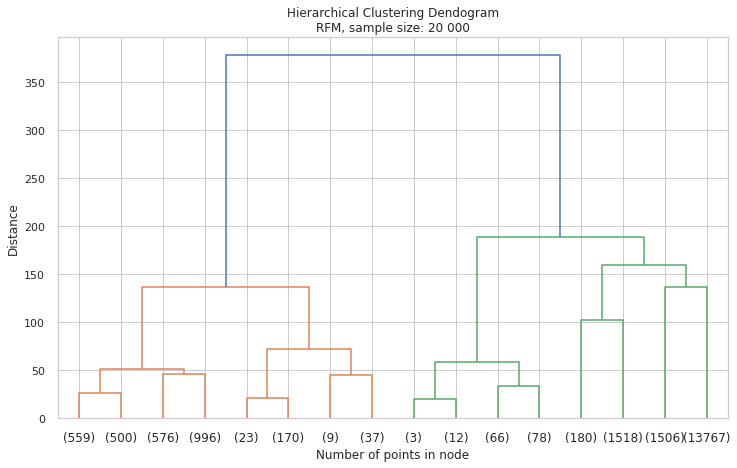

In [76]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


fig = plt.figure(figsize=(12,7))
plot_dendrogram(cls, truncate_mode='level', p=3)
plt.title('Hierarchical Clustering Dendogram\nRFM, sample size: 20 000')
plt.xlabel('Number of points in node') 
plt.ylabel('Distance')
plt.show()

After trying different values between 50 and 100, we train the agglomerative clustering to cut at a distance threshold equal to `90`, since, from the dendrogram, it seems to separate well the clusters, with a reasonable number of clusters.

In [77]:
# Train a model that cuts the distance at 90
cls = AgglomerativeClustering(
    n_clusters=None,
    compute_full_tree=True,
    distance_threshold=135
)

cls.fit(X_norm_sample)

AgglomerativeClustering(compute_full_tree=True, distance_threshold=135,
                        n_clusters=None)

In [78]:
print(f'The number of clusters is: {cls.n_clusters_}')

The number of clusters is: 6


In [79]:
print('The sizes of clusters are: ')
pd.Series(cls.labels_).value_counts()

The sizes of clusters are: 


0    13767
5     2631
1     1698
4     1506
3      239
2      159
dtype: int64

In [80]:
print('The silhouette score is:')
silhouette_score(X_norm_sample, cls.labels_, sample_size=1000).round(2)

The silhouette score is:


0.41

In [81]:
print('The calinski_harabasz_score score is:')
calinski_harabasz_score(X_norm_sample, cls.labels_).round(2)

The calinski_harabasz_score score is:


7522.01

#### Cluster visualization

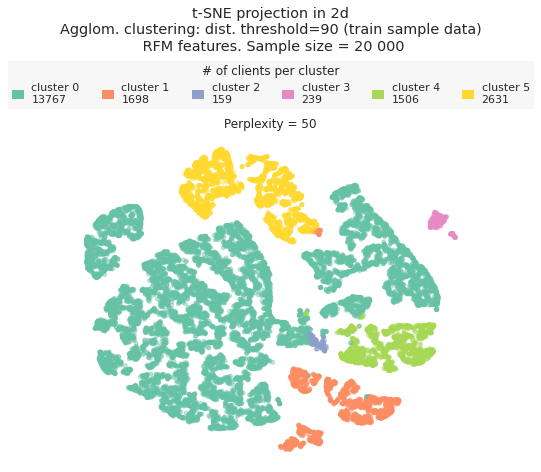

In [82]:
# Plot t-SNE 2d projection
title = 't-SNE projection in 2d\nAgglom. clustering: dist. threshold=90 (train sample data)\n RFM features. Sample size = 20 000'
plot_tsne_one(
        X_embedded_2d,
        cls,
        title,
        perp = 50)

We can see that, for the perplexity value=50, this clustering seems to define a clear separation of groups of observations.

* Intra-cluster


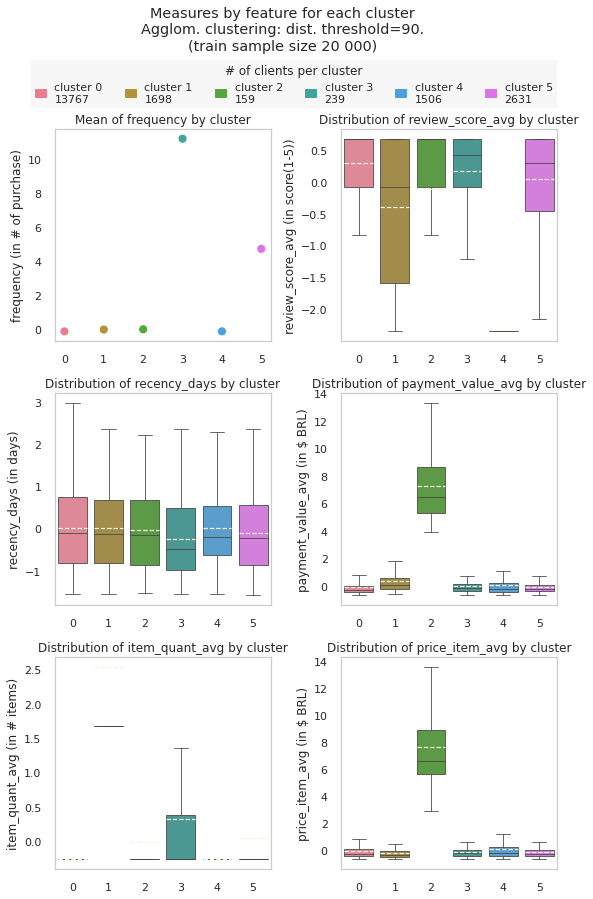

In [83]:
# Plot
plot_mean_std(
    X_norm_sample, 
    cls, 
    feats, 
    units, 
    'Agglom. clustering: dist. threshold=90.\n(train sample size 20 000)', 
    adjust=True
    )

### Hierarchical clustering conclusion

This model worked fine for our sample of 20 000 individuals. But it would not be practical to spend time and ressources to train this model with the whole data base, which is 5 times bigger.

Moreover, for this selection of hyperparameters, the segmentation was not as balanced as with KMeans ; there are two **very small clusters**, with less than 300 individuals.

For these reasons we decide to stay with KMeans (n_clusters=6) for our chosen model.

# Export data for maintenance simulation

In [84]:
# Export data for maintenance simulation

data_simul = df[feats + ['order_purchase_timestamp']]
data_simul.to_csv('./data' + 'data_for_simulation.csv', index = False)